In [1]:
import networkx as nx
import wandb

import color_utils
from data_generation.motifs import SparseGraph, CircleMotif, FullyConnectedMotif
from color_utils import ColorUtils
from typing import Optional
from matplotlib import pyplot as plt
import torch
import torch_geometric
from torch_geometric.data import Data
import numpy as np
from analyzer import Analyzer
import seaborn as sns

Didn't find resource module and therefore can't apply fix for wandb logging potentially dying. This is expected on non-unix machines.


In [7]:
# nclusters lvl1: hierarch: 10, mutag: 20, BBBP: 15, express: 10, [redditbin: 30] IMPORTANT: while use_k_hop=False would also work, it is our method, For GCExplainer, use use_k_hop=True
num_hops_gcexplainer = None
kwargs_dict = {
    "hierarch_gcn": {"num_gcexplainer_clusters": 10, "num_hops": num_hops_gcexplainer},
    "mutag_gcn": {"num_gcexplainer_clusters": 20, "num_hops": num_hops_gcexplainer},
    "BBBP_gcn": {"num_gcexplainer_clusters": 15, "num_hops": num_hops_gcexplainer},
    "express_gcn": {"num_gcexplainer_clusters": 10, "num_hops": num_hops_gcexplainer},
    "redditbin_gcn": {"load_part": 0.01, "num_gcexplainer_clusters": 30, "num_hops": num_hops_gcexplainer},
    "redditbin_kmeans": {"load_part": 0.5},
    "redditbin_diffpool": {"load_part": 0.5},
}

wandb_completeness_dict = {
    # "hierarch_kmeans": ["dffrco9s", "u01pnnwy", "fzs84cpe"],
    "hierarch_diff_pool": ["xwfx78d4", "xzi0j0mz", "v50dlhxd"],
    # "hierarch_hyperplane": ["zmx5fvmn", "koh410t4", "9sysn79k"],
    # "hierarch_gcn": ["k5mugtiu", "cljvn0x7", "4z8hbyve"],
    # "hierarch_global": ["9n0cp0p4", "wykonnu8", "7zxn9wub"],
    # #
    # "mutag_softsampling": ["v4uys5yi", "u3os264c", "in12314m"],
    # "mutag_sequential": ["xmi96d32", "s2rydeys", "biaraap6"],
    # "mutag_global": ["0lyqmh03", "qwj1dy75", "3ud1u4po"],
    # "mutag_diffpool": ["akkj2suh", "syayr4p2", "1kb6y579"],
    # "mutag_hyperplane": ["wrxfkzt0", "u316cqlr", "6wmf41pm"],
    #"mutag_kmeans": ["1jjqtth1", "zc9fwdzl", "lv73y6he"],
    # "mutag_gcn": ["ilojjs4d", "r41h6hxc", "45dgblwn"],

    # "redditbin_kmeans": ["tckckifo", "djdnwzwt", "8ks4yr9x"],
    # "redditbin_diffpool": ["bugn13h7", "9dlubq8m", "fz0z4573"],
    # "redditbin_gcn": ["yy2b5ac0", "x4v5ojsv", "3q7jh0jj"],

    #"BBBP_kmeans": ["p27xu96k", "c8gn54qn", "8uz38reg"],
    # "BBBP_hyperplane": ["r6t6we3a", "85zov3xy", "ywajgrya"],
    # "BBBP_diffpool": ["m9y97rxh", "1dkchu2n", "4rbp9pj2"],
    # "BBBP_gcn": ["ppckslwg", "qxqg1tux", "l0nuv1cr"],
    # "BBBP_global": ["mj8ntoyf", "9j5pzuzx", "hu87taa6"],
    # #
    # "express_kmeans": ["1z19grgs", "3svdj8x5", "mmvdbdqz"],
    # "express_diffpool": ["3ecc0u15", "pk848hfr", "11dnglra"],
    # "express_gcn": ["3b6py9bw", "3jir76vv", "wrr3rea9"],

}

wandb_others_dict = {
    "hierarch_gcn": ["k5mugtiu", "cljvn0x7", "4z8hbyve"],
    "hierarch_asap": ["zwh2jxji", "9ot17dgl", "tfc6bhvu"],

    "BBBP_gcn": ["ppckslwg", "qxqg1tux", "l0nuv1cr"],
}

Default number of threads: 14, using 14!


C:\Users\jonas\OneDrive\Dokumente\Studium\Master\Project\MPhilThesis\train.py:362: UserWarning: Warning: resuming a training run is equivalent to continuing the same run in expectation but may  not give the same result deterministically due to the reset of the random seed.
  warnings.warn("Warning: resuming a training run is equivalent to continuing the same run in expectation but"
0it [00:00, ?it/s]
C:\Users\jonas\OneDrive\Dokumente\Studium\Master\Project\MPhilThesis\analyzer.py:67: UserWarning: Overwriting the batch size can have a significant impact on the clustering and therefore the inference behaviour!
  warnings.warn("Overwriting the batch size can have a significant impact on the clustering and therefore "


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00,  4.93it/s]


Loaded 2304 train and test samples. Accuracy 100.00%


100%|██████████| 256/256 [00:06<00:00, 41.41it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00,  7.12it/s]


Loaded 2304 train and test samples. Accuracy 100.00%


100%|██████████| 256/256 [00:03<00:00, 76.78it/s]


<Figure size 640x480 with 0 Axes>

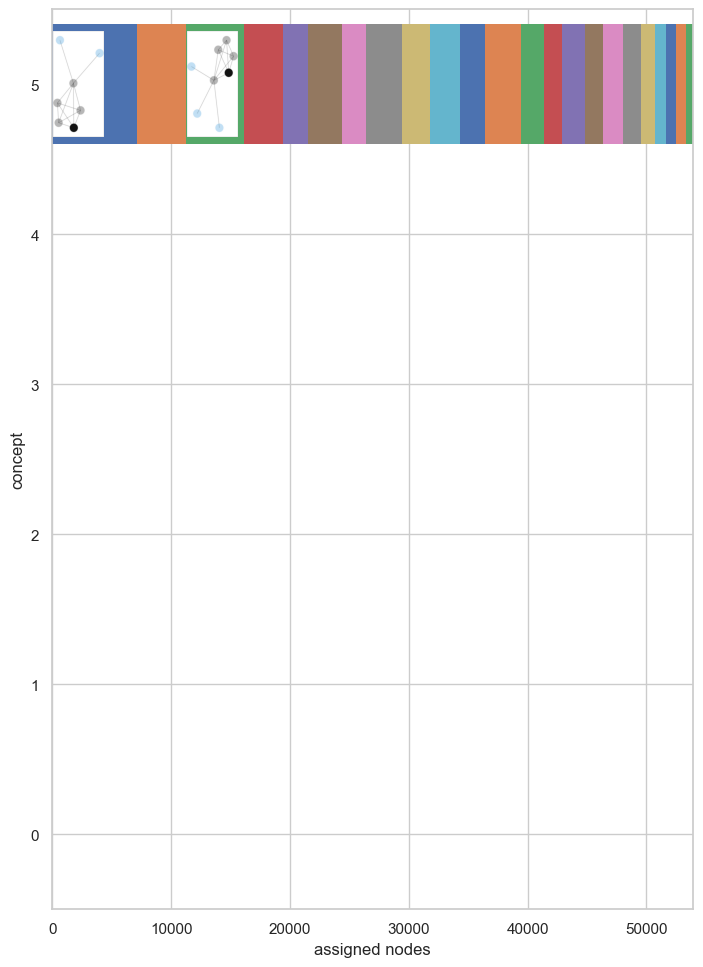

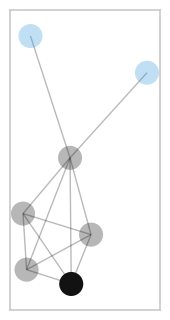

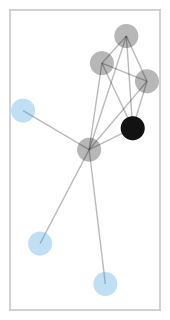

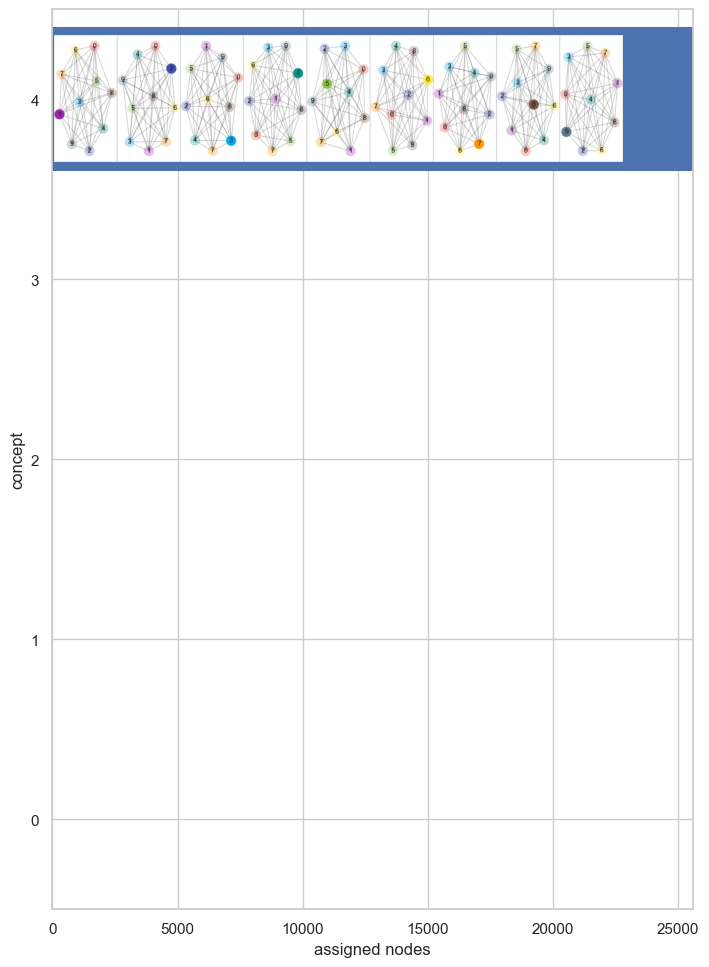

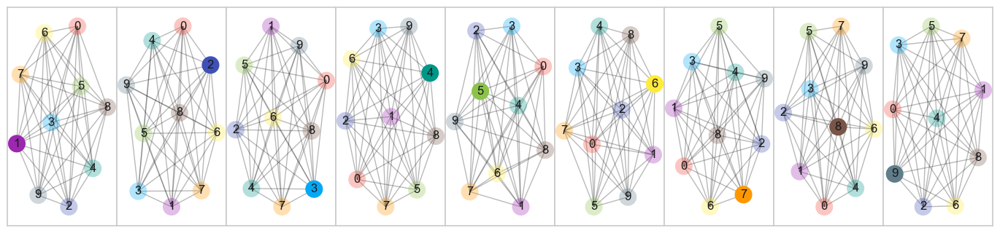

In [10]:
p_general = {
        "font.family": "STIXGeneral", #"Computer Modern",  # "STIXGeneral",  # Nice alternative font.
        # "font.family": "serif",
        # "font.serif": [],
        # Use 10pt font in plots, to match 10pt font in document
        "axes.labelsize": 10,
        "font.size": 10,
        # Make the legend/label fonts a little smaller
        "legend.fontsize": 10,
        "xtick.labelsize": 9,
        "ytick.labelsize": 9,
        # Set the font for maths
        "mathtext.fontset": "cm",
        # "font.sans-serif": ["DejaVu Sans"],  # gets rid of error messages
        # "font.monospace": [],
        "lines.linewidth": 1.5,
        "scatter.marker": "+",
        "image.cmap": "RdYlBu_r",
        "text.usetex": False,
    }

sns.set_theme()
sns.set_style("whitegrid", {'axes.grid' : True})
sns.color_palette("tab20")
sns.set_context(rc = {'patch.linewidth': 0.0})
sns.despine()
#matplotlib.rcParams.update(p_general)

# nclusters lvl1: hierarch: 10, mutag: 20, BBBP: 15, express: 10, [redditbin: 30] IMPORTANT: while use_k_hop=False would also work, it is our method, For GCExplainer, use use_k_hop=True
# inference_with_train should be True to make decision trees match the plot but False to make redditbin feasible
for k, v in wandb_completeness_dict.items():
    self = Analyzer(v[0], resume_last=False, device="cpu", batch_size=6000)
    for ps in range(2):
        self.count_subgraphs(pool_step=ps, load_part=1, use_k_hop=False, inference_with_train=True, use_only_test = True, plot_num_subgraphs=False, plot_num_nodes=True, save_path=f"img/qualitative/counts_{k.split('_')[0]}_{ps}.svg", max_neighborhoods_to_store=10, min_occs_to_store=0, horizontal=True, max_occs_to_merge=1000, min_nodes_to_merge=2, merge_concepts=False, num_gcexplainer_clusters=10, num_hops=None, min_nodes_for_legend=1000, plot_example_graphs=True, example_scale=0.7, example_width_scale=0.5)


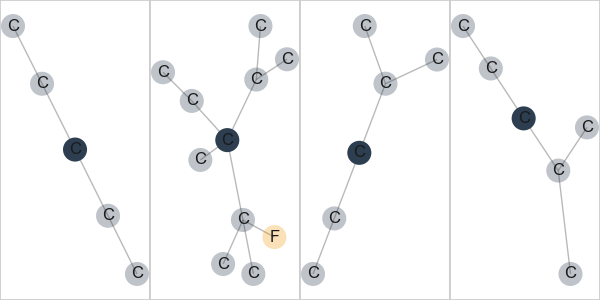

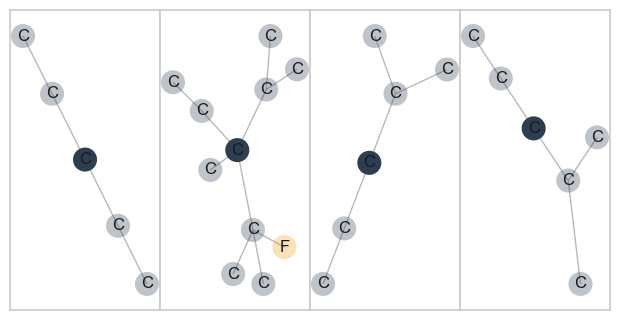

In [19]:
import PIL
from typing import List


def plot_single_concept_examples(examples: List[nx.Graph], pool_step: int, width_scale: float = 1.0):
        fig, axes = plt.subplots(1, len(examples), figsize=(3 * len(examples) * width_scale, 3))
        if len(examples) == 1:
            axes = [axes]
        for i, ex in enumerate(examples):
            Analyzer.plot_nx_concept_graph(ex, pool_step, ax=axes[i])
            axes[i].grid(False)
        fig.subplots_adjust(top=1, bottom=0, right=1, left=0, hspace=0, wspace=0)
        fig.canvas.draw()
        return PIL.Image.frombytes('RGB', fig.canvas.get_width_height(), fig.canvas.tostring_rgb())
plot_single_concept_examples(subgraphs[0][2][0][:4], POOL_STEP, 0.5)

In [4]:

self = Analyzer(wandb_completeness_dict["hierarch_gcn"][0], resume_last=False, device="cpu", batch_size=6000) # If resume_last False, use BEST checkpoint instead"
# hierarchical: dffrco9s
# hierarch gcn: k5mugtiu
# mutag: 1jjqtth1
# BBBP: p27xu96k
# redditbin: tckckifo
# mutag seq: xmi96d32
# expressvity 1z19grgs
POOL_STEP = 0
NAME = "hierarch" #tt: train_test
# mutag hyperplane: wrxfkzt0
# first that worked well: vm2opsxh

Default number of threads: 14, using 14!


C:\Users\jonas\OneDrive\Dokumente\Studium\Master\Project\MPhilThesis\train.py:362: UserWarning: Warning: resuming a training run is equivalent to continuing the same run in expectation but may  not give the same result deterministically due to the reset of the random seed.
  warnings.warn("Warning: resuming a training run is equivalent to continuing the same run in expectation but"
0it [00:00, ?it/s]
C:\Users\jonas\OneDrive\Dokumente\Studium\Master\Project\MPhilThesis\analyzer.py:67: UserWarning: Overwriting the batch size can have a significant impact on the clustering and therefore the inference behaviour!
  warnings.warn("Overwriting the batch size can have a significant impact on the clustering and therefore "


In [14]:
data_loader = self.train_loader.__class__(self.train_loader.dataset +
                                                      self.test_loader.dataset,
                                                      self.train_loader.batch_size)

all_data = self.load_required_data(data_loader, 1, "joint train and test",
                                     ["x", "target", "info_pooling_assignments"])

NOT remapping assignments between batches!


100%|██████████| 1/1 [00:01<00:00,  1.03s/it]

Loaded 2304 joint train and test samples. Accuracy 100.00%


In [ ]:
torch.max(all_data["info_pooling_assignments"][0])

NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00,  6.12it/s]


Loaded 2304 train and test samples. Accuracy 100.00%


100%|██████████| 256/256 [00:46<00:00,  5.45it/s]


None


<Figure size 640x480 with 0 Axes>

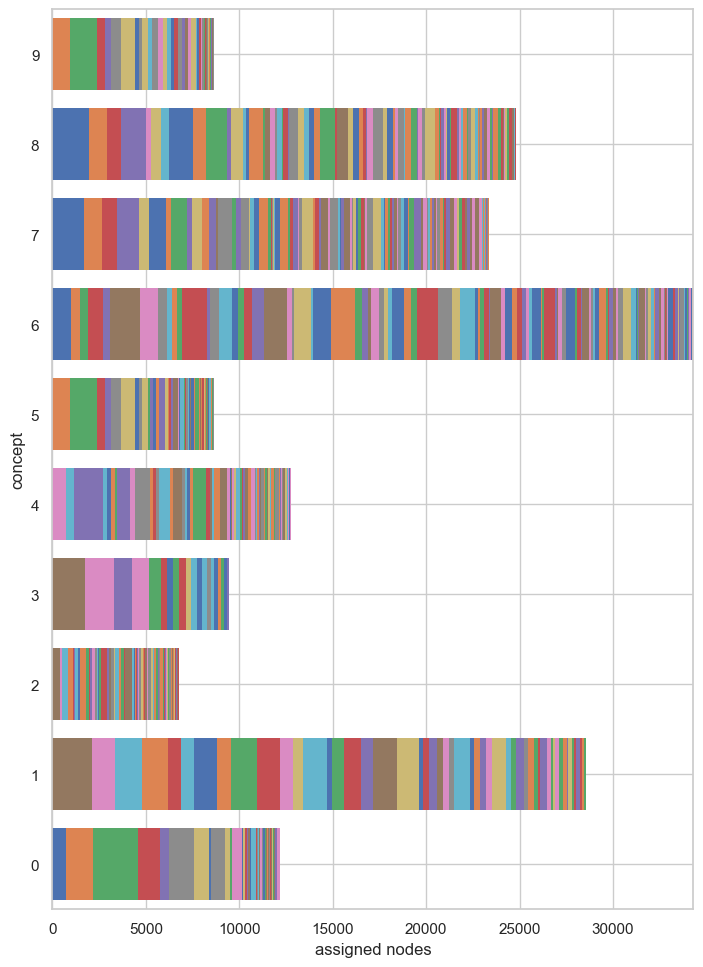

In [5]:
import matplotlib

p_general = {
        "font.family": "STIXGeneral", #"Computer Modern",  # "STIXGeneral",  # Nice alternative font.
        # "font.family": "serif",
        # "font.serif": [],
        # Use 10pt font in plots, to match 10pt font in document
        "axes.labelsize": 10,
        "font.size": 10,
        # Make the legend/label fonts a little smaller
        "legend.fontsize": 10,
        "xtick.labelsize": 9,
        "ytick.labelsize": 9,
        # Set the font for maths
        "mathtext.fontset": "cm",
        # "font.sans-serif": ["DejaVu Sans"],  # gets rid of error messages
        # "font.monospace": [],
        "lines.linewidth": 1.5,
        "scatter.marker": "+",
        "image.cmap": "RdYlBu_r",
        "text.usetex": False,
    }

sns.set_theme()
sns.set_style("whitegrid", {'axes.grid' : True})
sns.color_palette("tab20")
sns.set_context(rc = {'patch.linewidth': 0.0})
sns.despine()
#matplotlib.rcParams.update(p_general)
POOL_STEP = 0
NAME = "test"
# TODO inference_with_train before annotation
# nclusters lvl1: hierarch: 10, mutag: 20, BBBP: 15, express: 10, [redditbin: 30] IMPORTANT: while use_k_hop=False would also work, it is our method, For GCExplainer, use use_k_hop=True
# inference_with_train should be True to make decision trees match the plot but False to make redditbin feasible
subgraphs, purities = self.count_subgraphs(pool_step=POOL_STEP, load_part=1, use_k_hop=True, inference_with_train=True, use_only_test = True, plot_num_subgraphs=False, plot_num_nodes=True, save_path=f"img/qualitative/counts_{NAME}_{POOL_STEP}.svg", max_neighborhoods_to_store=10, min_occs_to_store=0, horizontal=True, max_occs_to_merge=1000, min_nodes_to_merge=2, merge_concepts=False, num_gcexplainer_clusters=10, num_hops=None, min_nodes_for_legend=1000, plot_example_graphs=True)
print(purities)

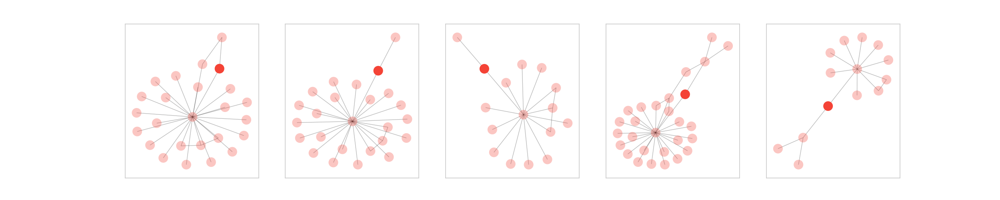

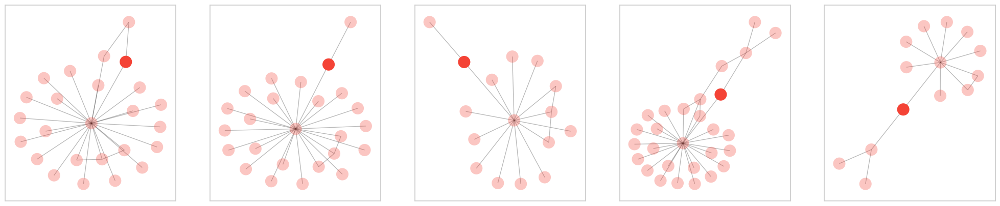

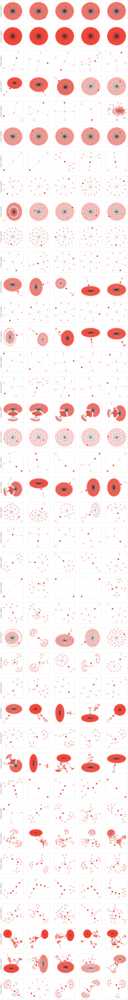

In [11]:
filter_subgraphs = None
# selected_concept = 3
# filter_subgraphs = [i for i, data in enumerate(subgraphs) if data[1][selected_concept] > 0]

sns.set_style("whitegrid", {'axes.grid' : False})
self.plot_extended_concept_examples(subgraphs, POOL_STEP, filter_subgraphs=filter_subgraphs, #filter_concepts=[0],
samples_per_concept=5, save_path=f"img/qualitative/subgraphs_{NAME}_{POOL_STEP}.svg", num_concepts=40)

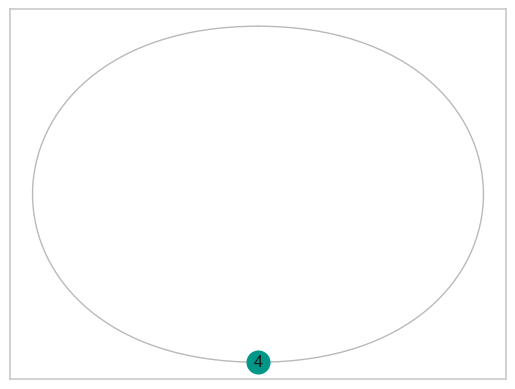

In [15]:
Analyzer.plot_nx_concept_graph(subgraphs[15][0], 1)

In [ ]:
import seaborn as sns
sns.reset_orig()
# TODO when putting this in the appendix, highlight the path I describe, rotate by 90 degrees and give the accuracy of the decision tree, mentioning max depth 4, also mention class format: <highlevel motif>:lowlevel motifs
self.calculate_concept_completeness(seeds=[1], plot_tree=True, max_depth=4, save_path=f"img/qualitative/decision_tree_{NAME}")

In [6]:
import os
import sys
import warnings
from typing import List
from analyzer import Analyzer
import torch

def overall_completeness(wandb_runs: List[str], seeds=[1, 2, 3], completeness_kwargs: dict = {}, **kwargs):
    results = None
    for run_id in wandb_runs:
        # sys.stdout = open(os.devnull, 'w')
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            analyzer = Analyzer(run_id, **kwargs)
            res = analyzer.calculate_concept_completeness(seeds=seeds, data_part=1, verbose=False, plot_tree=False, **completeness_kwargs)
        if results is None:
            results = res
        else:
            results = torch.cat((results, res), dim=0)
        # sys.stdout = sys.__stdout__
    stds, means = torch.std_mean(results, dim=0)
    print(" & ".join([f"{100*means[i]:.1f}\%$\\pm${100*stds[i]:.1f}" for i in range(stds.shape[0])]))
    return results

# 79.1\%$\pm$3.6 & 77.9\%$\pm$0.6 & 77.9\%$\pm$0.6
for k, v in wandb_completeness_dict.items():
    print(k)
    overall_completeness(v, completeness_kwargs=kwargs_dict.get(k, {}), resume_last=True, device="cpu", batch_size=6000)

hierarch_kmeans
Default number of threads: 14, using 14!


0it [00:00, ?it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


Loaded 2304 joint train and test samples. Accuracy 100.00%
NOT remapping assignments between batches!


100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


Loaded 2304 joint train and test samples. Accuracy 100.00%
NOT remapping assignments between batches!


100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


Loaded 2304 joint train and test samples. Accuracy 100.00%
Default number of threads: 14, using 14!


0it [00:00, ?it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


Loaded 2304 joint train and test samples. Accuracy 100.00%
NOT remapping assignments between batches!


100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


Loaded 2304 joint train and test samples. Accuracy 100.00%
NOT remapping assignments between batches!


100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


Loaded 2304 joint train and test samples. Accuracy 98.74%
Default number of threads: 14, using 14!


0it [00:00, ?it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


Loaded 2304 joint train and test samples. Accuracy 100.00%
NOT remapping assignments between batches!


100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


Loaded 2304 joint train and test samples. Accuracy 100.00%
NOT remapping assignments between batches!


100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


Loaded 2304 joint train and test samples. Accuracy 100.00%
46.9\%$\pm$0.0 & 100.0\%$\pm$0.0 & 99.5\%$\pm$1.4
mutag_kmeans
Default number of threads: 14, using 14!


0it [00:00, ?it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:59<00:00, 59.40s/it]


Loaded 3904 joint train and test samples. Accuracy 85.55%
NOT remapping assignments between batches!


  0%|          | 0/1 [00:21<?, ?it/s]


KeyboardInterrupt: 

In [15]:
import warnings
from typing import List
from analyzer import Analyzer
import torch

def overall_purity(wandb_runs: List[str], num_pool_steps: int = 2, purity_kwargs: dict = {}, **kwargs):
    results = torch.zeros(len(wandb_runs), num_pool_steps * 2)
    general_kwargs = dict(inference_with_train=False, max_neighborhoods_to_store=0, min_occs_to_store=100, horizontal=True, plot_num_subgraphs=False, plot_num_nodes=False, merge_concepts=False)
    for i, run_id in enumerate(wandb_runs):
        # sys.stdout = open(os.devnull, 'w')
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            analyzer = Analyzer(run_id, **kwargs)
            for pool_step in range(num_pool_steps):
                _, purity = analyzer.count_subgraphs(pool_step=pool_step, **general_kwargs, **purity_kwargs, use_k_hop=False)
                results[i, pool_step * 2] = purity
                _, purity = analyzer.count_subgraphs(pool_step=pool_step, **general_kwargs, **purity_kwargs, use_k_hop=True)
                results[i, pool_step * 2 + 1] = purity
        # sys.stdout = sys.__stdout__
    stds, means = torch.std_mean(results, dim=0)
    return " & ".join([f"{100*means[i]:.1f}\%$\\pm${100*stds[i]:.1f}" for i in range(stds.shape[0])])

all_res = []
for k, v in wandb_completeness_dict.items():
    res_str = k + ": " + overall_purity(v, purity_kwargs=kwargs_dict.get(k, {}), resume_last=True, device="cpu", batch_size=6000, num_pool_steps=2)
    print(res_str)
    all_res.append(res_str)

for res in all_res:
    print(res)

Default number of threads: 14, using 14!


0it [00:00, ?it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00, 22.25it/s]


Loaded 256 test samples. Accuracy 100.00%


100%|██████████| 256/256 [00:01<00:00, 221.63it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00, 30.05it/s]


Loaded 256 test samples. Accuracy 100.00%


100%|██████████| 256/256 [00:03<00:00, 74.33it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00, 31.30it/s]


Loaded 256 test samples. Accuracy 100.00%


100%|██████████| 256/256 [00:00<00:00, 1031.10it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00, 28.57it/s]


Loaded 256 test samples. Accuracy 100.00%


100%|██████████| 256/256 [00:01<00:00, 134.53it/s]


Default number of threads: 14, using 14!


0it [00:00, ?it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00, 32.00it/s]


Loaded 256 test samples. Accuracy 100.00%


100%|██████████| 256/256 [00:01<00:00, 222.31it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00, 35.75it/s]


Loaded 256 test samples. Accuracy 100.00%


100%|██████████| 256/256 [00:03<00:00, 75.52it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00, 37.04it/s]


Loaded 256 test samples. Accuracy 100.00%


100%|██████████| 256/256 [00:00<00:00, 1075.04it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00, 33.60it/s]


Loaded 256 test samples. Accuracy 100.00%


100%|██████████| 256/256 [00:01<00:00, 137.90it/s]


Default number of threads: 14, using 14!


0it [00:00, ?it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00, 16.25it/s]


Loaded 256 test samples. Accuracy 100.00%


100%|██████████| 256/256 [00:03<00:00, 72.21it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00, 16.59it/s]


Loaded 256 test samples. Accuracy 100.00%


100%|██████████| 256/256 [00:11<00:00, 23.06it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00, 16.67it/s]


Loaded 256 test samples. Accuracy 100.00%


100%|██████████| 256/256 [00:00<00:00, 317.08it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00, 17.40it/s]


Loaded 256 test samples. Accuracy 100.00%


100%|██████████| 256/256 [00:05<00:00, 43.97it/s]


hierarch_diff_pool: 0.0\%$\pm$0.0 & 27.2\%$\pm$0.0 & 100.0\%$\pm$0.0 & 100.0\%$\pm$0.0
Default number of threads: 14, using 14!


0it [00:00, ?it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:01<00:00,  1.96s/it]


Loaded 435 test samples. Accuracy 78.39%


100%|██████████| 435/435 [00:18<00:00, 23.13it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


Loaded 435 test samples. Accuracy 78.39%


100%|██████████| 435/435 [00:23<00:00, 18.89it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


Loaded 435 test samples. Accuracy 78.39%


100%|██████████| 435/435 [00:01<00:00, 312.38it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


Loaded 435 test samples. Accuracy 78.39%


100%|██████████| 435/435 [00:09<00:00, 44.42it/s]


Default number of threads: 14, using 14!


0it [00:00, ?it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


Loaded 435 test samples. Accuracy 79.08%


100%|██████████| 435/435 [00:18<00:00, 23.20it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


Loaded 435 test samples. Accuracy 79.08%


100%|██████████| 435/435 [00:22<00:00, 19.04it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


Loaded 435 test samples. Accuracy 79.08%


100%|██████████| 435/435 [00:01<00:00, 315.34it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


Loaded 435 test samples. Accuracy 79.08%


100%|██████████| 435/435 [00:09<00:00, 44.35it/s]


Default number of threads: 14, using 14!


0it [00:00, ?it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:01<00:00,  1.96s/it]


Loaded 435 test samples. Accuracy 77.24%


100%|██████████| 435/435 [00:18<00:00, 23.11it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:01<00:00,  1.96s/it]


Loaded 435 test samples. Accuracy 77.24%


100%|██████████| 435/435 [00:23<00:00, 18.89it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


Loaded 435 test samples. Accuracy 77.24%


100%|██████████| 435/435 [00:01<00:00, 321.51it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


Loaded 435 test samples. Accuracy 77.24%


100%|██████████| 435/435 [00:09<00:00, 44.36it/s]


mutag_diffpool: 42.9\%$\pm$0.0 & 12.4\%$\pm$0.0 & 100.0\%$\pm$0.0 & 100.0\%$\pm$0.0
Default number of threads: 14, using 14!


0it [00:00, ?it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00,  7.45it/s]


Loaded 205 test samples. Accuracy 97.56%


100%|██████████| 205/205 [00:01<00:00, 152.09it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00,  8.59it/s]


Loaded 205 test samples. Accuracy 97.56%


100%|██████████| 205/205 [00:07<00:00, 28.10it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00,  8.76it/s]


Loaded 205 test samples. Accuracy 97.56%


100%|██████████| 205/205 [00:00<00:00, 313.89it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00,  9.21it/s]


Loaded 205 test samples. Accuracy 97.56%


100%|██████████| 205/205 [00:04<00:00, 42.90it/s]


Default number of threads: 14, using 14!


0it [00:00, ?it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00,  7.95it/s]


Loaded 205 test samples. Accuracy 96.59%


100%|██████████| 205/205 [00:01<00:00, 193.70it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00,  8.61it/s]


Loaded 205 test samples. Accuracy 96.59%


100%|██████████| 205/205 [00:06<00:00, 29.33it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00,  8.72it/s]


Loaded 205 test samples. Accuracy 96.59%


100%|██████████| 205/205 [00:00<00:00, 312.62it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00,  7.71it/s]


Loaded 205 test samples. Accuracy 96.59%


100%|██████████| 205/205 [00:04<00:00, 42.49it/s]


Default number of threads: 14, using 14!


0it [00:00, ?it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00,  8.17it/s]


Loaded 205 test samples. Accuracy 97.56%


100%|██████████| 205/205 [00:01<00:00, 191.19it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00,  8.27it/s]


Loaded 205 test samples. Accuracy 97.56%


100%|██████████| 205/205 [00:06<00:00, 29.72it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00,  8.22it/s]


Loaded 205 test samples. Accuracy 97.56%


100%|██████████| 205/205 [00:00<00:00, 314.27it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00,  7.80it/s]


Loaded 205 test samples. Accuracy 97.56%


100%|██████████| 205/205 [00:04<00:00, 44.58it/s]


BBBP_diffpool: 0.0\%$\pm$0.0 & 0.0\%$\pm$0.0 & 100.0\%$\pm$0.0 & 100.0\%$\pm$0.0
Default number of threads: 14, using 14!


0it [00:00, ?it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00, 16.51it/s]


Loaded 256 test samples. Accuracy 53.52%


100%|██████████| 256/256 [00:01<00:00, 165.42it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00, 18.14it/s]


Loaded 256 test samples. Accuracy 53.52%


100%|██████████| 256/256 [00:07<00:00, 33.24it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00, 13.85it/s]


Loaded 256 test samples. Accuracy 53.52%


100%|██████████| 256/256 [00:00<00:00, 299.41it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00, 15.01it/s]


Loaded 256 test samples. Accuracy 53.52%


100%|██████████| 256/256 [00:05<00:00, 44.57it/s]


Default number of threads: 14, using 14!


0it [00:00, ?it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00, 16.67it/s]


Loaded 256 test samples. Accuracy 53.52%


100%|██████████| 256/256 [00:01<00:00, 170.19it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00, 15.47it/s]


Loaded 256 test samples. Accuracy 53.52%


100%|██████████| 256/256 [00:07<00:00, 33.84it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00, 19.65it/s]


Loaded 256 test samples. Accuracy 53.52%


100%|██████████| 256/256 [00:00<00:00, 308.34it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00, 18.48it/s]


Loaded 256 test samples. Accuracy 53.52%


100%|██████████| 256/256 [00:05<00:00, 44.81it/s]


Default number of threads: 14, using 14!


0it [00:00, ?it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00, 16.63it/s]


Loaded 256 test samples. Accuracy 53.52%


100%|██████████| 256/256 [00:01<00:00, 166.09it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00, 14.88it/s]


Loaded 256 test samples. Accuracy 53.52%


100%|██████████| 256/256 [00:07<00:00, 35.03it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00, 17.50it/s]


Loaded 256 test samples. Accuracy 53.52%


100%|██████████| 256/256 [00:00<00:00, 316.38it/s]


NOT remapping assignments between batches!


100%|██████████| 1/1 [00:00<00:00, 20.05it/s]


Loaded 256 test samples. Accuracy 53.52%


100%|██████████| 256/256 [00:05<00:00, 45.50it/s]

express_diffpool: 0.0\%$\pm$0.0 & 96.8\%$\pm$0.0 & 100.0\%$\pm$0.0 & 100.0\%$\pm$0.0
hierarch_diff_pool: 0.0\%$\pm$0.0 & 27.2\%$\pm$0.0 & 100.0\%$\pm$0.0 & 100.0\%$\pm$0.0
mutag_diffpool: 42.9\%$\pm$0.0 & 12.4\%$\pm$0.0 & 100.0\%$\pm$0.0 & 100.0\%$\pm$0.0
BBBP_diffpool: 0.0\%$\pm$0.0 & 0.0\%$\pm$0.0 & 100.0\%$\pm$0.0 & 100.0\%$\pm$0.0
express_diffpool: 0.0\%$\pm$0.0 & 96.8\%$\pm$0.0 & 100.0\%$\pm$0.0 & 100.0\%$\pm$0.0


In [ ]:
torch.zeros(1, dtype=torch.int)

In [ ]:
node_table, edge_table = self.log_graphs(10)
self.plot_wandb_tables(node_table, edge_table, 0, 2)

In [ ]:


###### MUTAG
NO2 = SparseGraph(torch.tensor([3, 1, 1], dtype=torch.long),
                  torch.tensor([[0, 1, 0, 2],
                                [1, 0, 2, 0]], dtype=torch.long))
FO2 = SparseGraph(torch.tensor([5, 1, 1], dtype=torch.long),
                  torch.tensor([[0, 1, 0, 2],
                                [1, 0, 2, 0]], dtype=torch.long))
SO2 = SparseGraph(torch.tensor([7, 1, 1], dtype=torch.long),
                  torch.tensor([[0, 1, 0, 2],
                                [1, 0, 2, 0]], dtype=torch.long))
carbon_ring = CircleMotif(6, [0], 1).sample()
# TODO also 2/3 merged rings. Add option to search for multiple motifs together. Actually, this could give a really nice, final joint chart with all the important motifs and how they are distributed


In [ ]:
### BBBP
atom_names = ['H', 'B', 'C', 'N', 'O', 'F', 'Na', 'P', 'S', 'Cl', 'Ca', 'Br', 'I']

NO2 = SparseGraph(torch.tensor([3, 4, 4], dtype=torch.long),
                  torch.tensor([[0, 1, 0, 2],
                                [1, 0, 2, 0]], dtype=torch.long))
FO2 = SparseGraph(torch.tensor([5, 4, 4], dtype=torch.long),
                  torch.tensor([[0, 1, 0, 2],
                                [1, 0, 2, 0]], dtype=torch.long))
SO2 = SparseGraph(torch.tensor([8, 4, 4], dtype=torch.long),
                  torch.tensor([[0, 1, 0, 2],
                                [1, 0, 2, 0]], dtype=torch.long))
carbon_ring = CircleMotif(6, [2], 3).sample()
carbon_ring.x = torch.argmax(carbon_ring.x, dim=-1)

In [ ]:
FC4 = FullyConnectedMotif(4, [0], 1).sample()
FC4.x = torch.argmax(FC4.x, dim=-1)

In [ ]:




#
# find_subgraph(self, FC4.edge_index, FC4.x.squeeze(-1), pool_step=0, load_part=1)

In [ ]:
torch.as_tensor(torch.tensor(4))

In [ ]:
def one_hot(indices: int | torch.Tensor, num_classes: Optional[int] = None, **kwargs):
    indices = torch.as_tensor(indices)
    assert indices.ndim <= 1 # Otherwise would need to deal with arange over arbitrary number of dimensions
    if num_classes is None:
        num_classes = torch.max(indices) + 1
    res = torch.zeros(indices.shape + (num_classes, ), **kwargs)
    if indices.ndim == 0:
        res[indices] = 1
    else:
        res[torch.arange(indices.shape[0]), indices] = 1
    return res

one_hot(2, 10)

In [ ]:
from tqdm import tqdm
from graphutils import adj_to_edge_index
from torch_geometric.utils import to_networkx, k_hop_subgraph
from torch_geometric.utils import to_networkx, k_hop_subgraph
import networkx.algorithms.isomorphism as iso
from graphutils import one_hot





subgraphs = self.count_subgraphs(pool_step=0, load_part=1, use_k_hop=False, inference_with_train=False)

In [ ]:
subgraphs2 = self.count_subgraphs(pool_step=0, load_part=1, use_k_hop=False)

In [ ]:
graph = list(buckets['bcb666336cd11cfe336b4f388b7d82e1'].keys())[0]
concepts_dict = nx.get_node_attributes(graph, "concept")
concepts = torch.tensor(len(c))

In [ ]:
from typing import List, Tuple


self.plot_extended_concept_examples(subgraphs2, 0, filter_subgraphs=None)

In [ ]:
1jjqtth1

In [ ]:
from networkx import weisfeiler_lehman_graph_hash
from data_generation.motifs import SplitHexagon
from torch_geometric.utils import to_networkx

# WL distinguishability of the 2 graphs
g1 = SplitHexagon([0], 1).sample()
g1 = to_networkx(Data(edge_index=g1.edge_index, num_nodes=g1.num_nodes()), to_undirected=True)
g2 = SplitHexagon([0], 1).sample()
g2 = to_networkx(Data(edge_index=g2.edge_index, num_nodes=g2.num_nodes()), to_undirected=True)
h1 = weisfeiler_lehman_graph_hash(g1, digest_size=64, iterations=50)
h2 = weisfeiler_lehman_graph_hash(g1, digest_size=64, iterations=50)
print(h1)
print(h2)

In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
test_data = self.load_required_data(self.test_loader, 0.1, "test", ["info_pooling_activations", "mask"])
activations = test_data["info_pooling_activations"][0][test_data["mask"]]
cluster_alg = self.model.graph_network.pool_blocks[0].cluster_alg
all_points = torch.cat((cluster_alg.sketches, cluster_alg.centroids, activations), dim=0)
coords = PCA(n_components=2).fit_transform(all_points)
end_sketches = cluster_alg.sketches.shape[0]
end_centroids = cluster_alg.centroids.shape[0] + end_sketches

print(cluster_alg.sketches.shape[0], cluster_alg.centroids.shape[0], activations.shape[0])
sns.color_palette()
fig, ax = plt.subplots(figsize=(3, 3))
ax.scatter(coords[:end_sketches, 0], coords[:end_sketches, 1], label="sketches", alpha=0.5, s=10)
ax.scatter(coords[end_centroids:, 0], coords[end_centroids:, 1], label="activations", alpha=0.5, s=10)
ax.scatter(coords[end_sketches:end_centroids, 0], coords[end_sketches:end_centroids, 1], label="centroids", alpha=1, s=20, marker="x", c="#A85555")
ax.legend()

fig.savefig("img/sequential_embeddings.pdf", bbox_inches="tight")

In [ ]:
import pandas as pd
import numpy as np


df = pd.DataFrame(np.array([
                       [99.9, 0.2, "Synthetic\nHierarchical", "Ours"],
                       [100, 0, "Synthetic\nHierarchical", "Standard GNN"],
                       [100, 0, "Synthetic\nHierarchical", "DiffPool"],
                       [96.9, 4.8, "Synthetic\nHierarchical", "ASAP"],

                       [77.0, 2.3, "Mutagenicity", "Ours"],
                       [80.5, 0.7, "Mutagenicity", "Standard GNN"],
                       [78.7, 0.6, "Mutagenicity", "DiffPool"],
                       [76.2, 1.7, "Mutagenicity", "ASAP"],

                       [85, 1.6, "BBBP", "Ours"],
                       [84.9, 3.1, "BBBP", "Standard GNN"],

                       [88.7, 2.2, "REDDIT-\nBINARY", "Ours"],
                       [89.1, 0.9, "REDDIT-\nBINARY", "Standard GNN"],

                       [100, 0, "Synthetic\nExpressivity", "Ours"],
                       [53.5, 0, "Synthetic\nExpressivity", "Standard GNN"]

                       ]), columns=['acc', 'std', 'dataset', 'method'])

df["acc"] = pd.to_numeric(df["acc"])
df["std"] = pd.to_numeric(df["std"])
df["dataset"] = pd.Categorical(df["dataset"], ["Synthetic\nHierarchical", "Mutagenicity", "BBBP", "REDDIT-\nBINARY", "Synthetic\nExpressivity"]) # for ordering
df["method"] = pd.Categorical(df["method"], ["Ours", "Standard GNN", "DiffPool", "ASAP"]) # for ordering

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd


sns.set_theme()
sns.set_style("whitegrid", {'axes.grid' : True})
sns.color_palette("tab20")
#sns.despine()

def errplot(x, y, yerr, hue, **kwargs):
    data = kwargs.pop('data')
    p = data.pivot_table(index=x, columns=hue, values=y, aggfunc='mean')
    err = data.pivot_table(index=x, columns=hue, values=yerr, aggfunc='mean')
    p.plot(kind='bar', yerr=err, ax=plt.gca(), **kwargs)

#fig, ax = plt.subplots()
# grid = sns.catplot(
#     data=accuracies, kind="bar",
#     x="dataset", y="acc", hue="method",
#     errorbar="sd", alpha=1, height=3, aspect=2,
# )
grid = sns.FacetGrid(df, height=4, aspect=1.5)
grid.map_dataframe(errplot, "dataset", "acc", "std", "method", color=sns.color_palette("deep").as_hex(), width=0.8)

grid.set(xlabel='', ylabel='Accuracy (%)')
plt.subplots_adjust(right=0.90)
plt.legend(loc='center left', bbox_to_anchor=(1,0.8))
#ax.bar(x_pos, CTEs, yerr=error, align='center')#, alpha=0.5, ecolor='black', capsize=10)
# ax.set_ylabel('Coefficient of Thermal Expansion ($\degree C^{-1}$)')
# # ax.set_xticks(x_pos)
# # ax.set_xticklabels(materials)
# ax.set_title('Coefficent of Thermal Expansion (CTE) of Three Metals')
# plt.show()
grid.fig.savefig("img/accuracies.svg", bbox_inches="tight")

In [ ]:
sns.color_palette("deep").as_hex()

In [ ]:
pallete[:4]

In [ ]:
import pandas as pd
import numpy as np

in_distr = "in distr."
ood = "OOD"
df = pd.DataFrame(np.array([
                       [98, 0.6, "Ours (graph-level)", in_distr],
                       [73, 6.31, "Ours (graph-level)", ood],

                       [100, 0, "Ours (node-wise)", in_distr],
                       [100, 0, "Ours (node-wise)", ood],

                       [99.79, 0.2, "Ibarz et al.", in_distr],
                       [53.92, 14.06, "Ibarz et al.", ood],

                       ]), columns=['acc', 'std', 'method', 'distr'])

df["acc"] = pd.to_numeric(df["acc"])
df["std"] = pd.to_numeric(df["std"])
df["dataset"] = pd.Categorical(df["dataset"], ["Synthetic\nHierarchical", "Mutagenicity", "BBBP", "REDDIT-\nBINARY", "Synthetic\nExpressivity"]) # for ordering
df["method"] = pd.Categorical(df["method"], ["Ours", "Standard GNN", "DiffPool", "ASAP"]) # for ordering

sns.set_theme()
sns.set_style("whitegrid", {'axes.grid' : True})
sns.color_palette("tab20")
#sns.despine()

def errplot(x, y, yerr, hue, **kwargs):
    data = kwargs.pop('data')
    p = data.pivot_table(index=x, columns=hue, values=y, aggfunc='mean')
    err = data.pivot_table(index=x, columns=hue, values=yerr, aggfunc='mean')
    p.plot(kind='bar', yerr=err, ax=plt.gca(), **kwargs)

grid = sns.FacetGrid(df, height=4, aspect=1.5)
grid.map_dataframe(errplot, "dataset", "acc", "std", "method", color=sns.color_palette("deep").as_hex(), width=0.8)

grid.set(xlabel='', ylabel='Accuracy (%)')
plt.subplots_adjust(right=0.90)
plt.legend(loc='center left', bbox_to_anchor=(1,0.8))
grid.fig.savefig("img/callstack_accuracies.svg", bbox_inches="tight")

In [11]:
torch.std_mean(torch.tensor([14.29, 14.86, 14.93, 10.66, 10.55, 11.02, 121.41, 146.09, 125.51]))

(tensor(59.5360), tensor(52.1467))

In [12]:
torch.std_mean(torch.tensor([1.46, 1.62, 1.44, 1.10, 1.17, 1.07, 16.83, 13.75, 13.79]))

(tensor(6.8000), tensor(5.8033))

In [13]:
torch.std_mean(torch.tensor([14.29, 14.86, 14.93, 10.66, 10.55, 11.02, 121.41, 146.09, 125.51]) / torch.tensor([1.46, 1.62, 1.44, 1.10, 1.17, 1.07, 16.83, 13.75, 13.79]))

(tensor(1.0305), tensor(9.4751))